In [1]:
# %install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py
%load_ext autotime
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon, MultiPolygon, MultiPoint
from IPython.display import Image
from descartes import PolygonPatch
from itertools import combinations, combinations_with_replacement
%matplotlib inline
ox.config(log_console=False, use_cache=True)
%config IPCompleter.greedy=True
import contextily as ctx
import rasterio

time: 1.42 s (started: 2021-08-15 10:47:32 +02:00)


In [2]:
# in case of encountering problems with GEOS or GDAL, disable speedups from shapely
from shapely import speedups
speedups.disable()

time: 433 µs (started: 2021-08-15 10:47:34 +02:00)


Milan coordinate reference system:  epsg:4326
Projected Milan coordinate reference system:  +proj=utm +zone=29 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


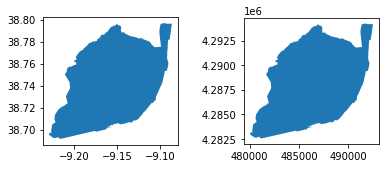

time: 448 ms (started: 2021-08-15 10:47:34 +02:00)


In [3]:
# load Milan city from openstreetmap using osmmnx api

city_name = 'Lisbon, Portugal'
city = ox.geocode_to_gdf(city_name)
print('Milan coordinate reference system: ', city.crs)

# project to the local coordinate reference system
city_proj = ox.projection.project_gdf(city)
print('Projected Milan coordinate reference system: ', city_proj.crs)

fig, (ax1, ax2) = plt.subplots(1, 2)
city.plot(ax=ax1, ec='none')
city_proj.plot(ax=ax2, ec='none' )
plt.tight_layout(pad=3.0)
plt.show()

In [4]:
# convert to "ESRI:54009" coordinate system, since that's the system NASA uses
city = city.to_crs("ESRI:54009") 
print(city.crs)

ESRI:54009
time: 221 ms (started: 2021-08-15 10:47:34 +02:00)


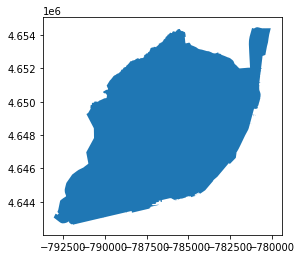

time: 129 ms (started: 2021-08-15 10:47:34 +02:00)


In [5]:
# plot city in new projection
ax = city.plot(ec='none')


In [6]:
# save to file
city.to_file('portugal_54009.shp')

time: 68.2 ms (started: 2021-08-15 10:47:34 +02:00)


<ipython-input-6-a9bfc1a60280>:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  city.to_file('portugal_54009.shp')


In [7]:
# load the saved file
import fiona
with fiona.open("portugal_54009.shp", "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

time: 173 ms (started: 2021-08-15 10:47:34 +02:00)


In [8]:
# load the NASA population density raster file
# Data source: https://sedac.ciesin.columbia.edu/data/collection/gpw-v4
import rasterio.mask
with rasterio.open("data/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0.tif") as src:
    # since the NASA data is for the entire world, we will use the 'shapes' polygon containing our city to mask out
    # the population raster data corresponding to our city
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True, nodata=0)
    out_meta = src.meta

time: 126 ms (started: 2021-08-15 10:47:35 +02:00)


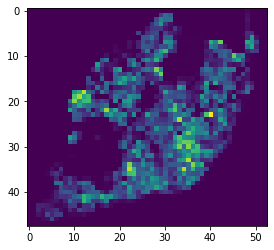

time: 102 ms (started: 2021-08-15 10:47:35 +02:00)


In [9]:
plt.imshow(out_image[0])

In [10]:
# since the raster array contains many dimensions, we assign the dimension containing the population density data to a new 
# variable
pop_density = out_image[0,:,:]
pop_density

array([[  0.     ,   0.     ,   0.     , ...,   0.     ,   0.     ,
          0.     ],
       [  0.     ,   0.     ,   0.     , ...,   0.     ,   0.     ,
          0.     ],
       [  0.     ,   0.     ,   0.     , ...,   0.     ,   0.     ,
          0.     ],
       ...,
       [  0.     ,   0.     , 122.33258, ...,   0.     ,   0.     ,
          0.     ],
       [  0.     ,   0.     ,   0.     , ...,   0.     ,   0.     ,
          0.     ],
       [  0.     ,   0.     ,   0.     , ...,   0.     ,   0.     ,
          0.     ]], dtype=float32)

time: 3.06 ms (started: 2021-08-15 10:47:35 +02:00)


In [11]:
# just in case, set all negative values to zero
pop_density[pop_density < 0] = 0

time: 443 µs (started: 2021-08-15 10:47:35 +02:00)


In [12]:
# split city into 400 x 400 meter grid cells
geometry = city_proj['geometry'].iloc[0]
print(type(geometry))
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width = 400)
print(type(geometry_cut))

<class 'shapely.geometry.polygon.Polygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
time: 2.1 s (started: 2021-08-15 10:47:35 +02:00)


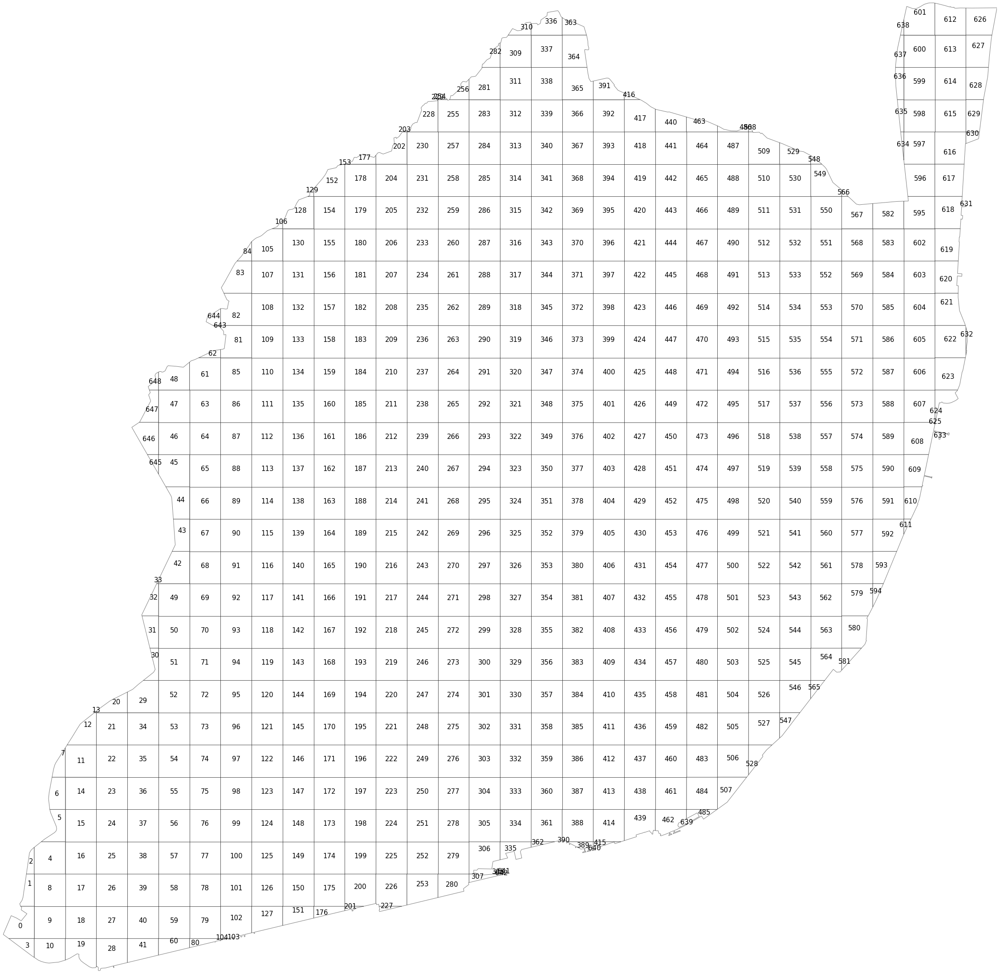

time: 3.32 s (started: 2021-08-15 10:47:37 +02:00)


In [13]:
polylist = [p for p in geometry_cut]

# plot city
west, south, east, north = city_proj.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=15)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [14]:
# create geodataframe from the square grid polygons
polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city_proj.crs
print(polyframe.crs)
polyframe.head()

+proj=utm +zone=29 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((480013.052 4282992.706, 480113.728 4..."
1,"POLYGON ((480231.425 4283332.102, 480230.355 4..."
2,"POLYGON ((480304.490 4283721.220, 480342.977 4..."
3,"POLYGON ((480403.360 4282942.984, 480403.360 4..."
4,"POLYGON ((480403.360 4284042.983, 480491.667 4..."


time: 28.8 ms (started: 2021-08-15 10:47:40 +02:00)


<AxesSubplot:>

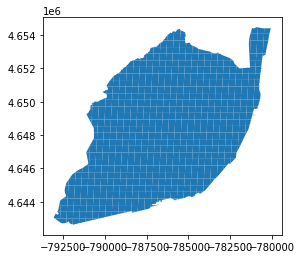

time: 537 ms (started: 2021-08-15 10:47:40 +02:00)


In [15]:
# convert to the NASA crs we introduced earlier
polyframe= polyframe.to_crs(city.crs)
polyframe.plot()

In [16]:
# load library for aggregating raster data into vector polygons
from rasterstats import zonal_stats

time: 58.1 ms (started: 2021-08-15 10:47:41 +02:00)


In [17]:
# compute the mean value of all raster values that fall into a given quadratic cell

affine = out_transform
city_stats = zonal_stats(polyframe, pop_density, affine=affine, stats='mean', nodata=0)
pop_array = np.array([list(item.values())[0] if list(item.values())[0] is not None else 0 for item in city_stats])
print(pop_array)

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.51821426e+01 0.00000000e+00 3.55302191e+00 0.00000000e+00
 1.96703621e+02 1.24402304e+02 5.00379944e+01 1.31020717e+01
 1.08348170e+02 0.00000000e+00 9.91109037e+00 1.62125244e+01
 4.78854549e+01 1.58585251e+02 3.44385521e+02 7.97047348e+01
 5.22111883e+01 1.71345099e+02 2.17887680e+02 4.12921490e+02
 2.03482147e+02 1.73906990e+02 7.30453510e+01 2.86352798e+02
 2.41502247e+02 1.32219344e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 1.73205650e+02 9.19063662e+01
 4.26849113e+02 5.52512756e+02 2.20676739e+02 5.66498203e+01
 2.31883556e+02 0.00000000e+00 8.82756104e+02 2.07884238e+01
 5.61150757e+02 6.37559479e+02 8.00988037e+02 1.70421582e+03
 1.23797357e+03 5.90702957e+02 1.03783598e+01 1.96165419e+01
 0.00000000e+00 0.00000000e+00 4.07516510e+02 3.99387146e+02
 5.67405823e+02 5.45967133e+02 3.71098572e+02 9.57620894e+01
 1.52159363e-01 1.90048975e+03 0.00000000e+00 1.28364677e+03
 1.11875372e+03 3.531230

In [18]:
city_stats[:10]

[{'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': 15.182142575581869},
 {'mean': None},
 {'mean': 3.5530219078063965},
 {'mean': None},
 {'mean': 196.70362091064453},
 {'mean': 124.40230369567871}]

time: 2.43 ms (started: 2021-08-15 10:47:42 +02:00)


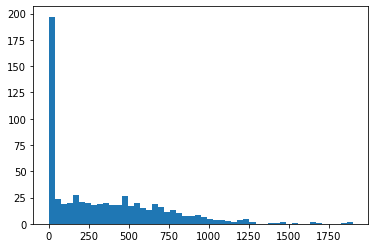

time: 173 ms (started: 2021-08-15 10:47:42 +02:00)


In [19]:
# plot histogram of the obtained population density values
plt.hist(pop_array, bins=50)
plt.show()

In [20]:
# assign the population values as a new column in the geodataframe with the grid cells, 
# so we know which grid cell has what population.

polyframe["population"] = pop_array
polyframe.head()

,geometry,population
0,"POLYGON ((-793074.696 4643053.514, -792961.642...",0.000000
1,"POLYGON ((-792838.533 4643398.334, -792839.529...",0.000000
2,"POLYGON ((-792742.980 4643793.216, -792689.695...",0.000000
3,"POLYGON ((-792691.967 4643004.060, -792705.652...",0.000000
4,"POLYGON ((-792625.962 4644119.833, -792534.647...",15.182143


time: 21.8 ms (started: 2021-08-15 10:47:42 +02:00)


(256, 4)
[[1.         0.96078431 0.94117647 1.        ]
 [0.99987697 0.95820069 0.93748558 1.        ]
 [0.99975394 0.95561707 0.93379469 1.        ]
 ...
 [0.41917724 0.00369089 0.05294887 1.        ]
 [0.4115494  0.00184544 0.05196463 1.        ]
 [0.40392157 0.         0.05098039 1.        ]]


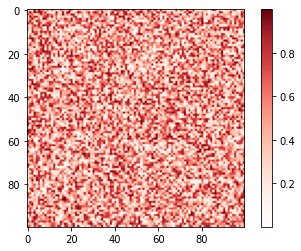

time: 188 ms (started: 2021-08-15 10:47:42 +02:00)


In [21]:
# in order to achieve a nice-looking visualisation, let's create a custom colormap, that fades away into transparency

ncolors = 256
# get cmap
color_array = plt.get_cmap('Reds')(range(ncolors))
print(color_array.shape)
print(color_array)

# change alpha values
color_array[:, -1] = np.linspace(0.3, 1, ncolors)

# create colormap object
import matplotlib.colors as colors
from matplotlib.colors import LinearSegmentedColormap

map_object = LinearSegmentedColormap.from_list(name="Reds_transp", colors=color_array)

# register the colormap object
plt.register_cmap(cmap=map_object)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap='Reds_transp')
plt.colorbar(mappable=h)

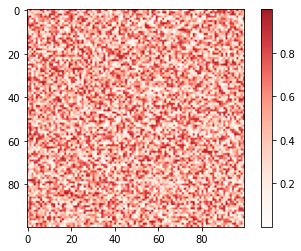

time: 171 ms (started: 2021-08-15 10:47:42 +02:00)


In [22]:
# let's cut it at the top for a better visual impact

def trunc_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = LinearSegmentedColormap.from_list('trunc({n}, {a:.2f}, {b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
                                                cmap(np.linspace(minval, maxval, n)))
    return new_cmap

cmap = plt.get_cmap('Reds_transp')
new_cmap = trunc_colormap(cmap, 0.0, .9)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap=new_cmap)
plt.colorbar(mappable=h)

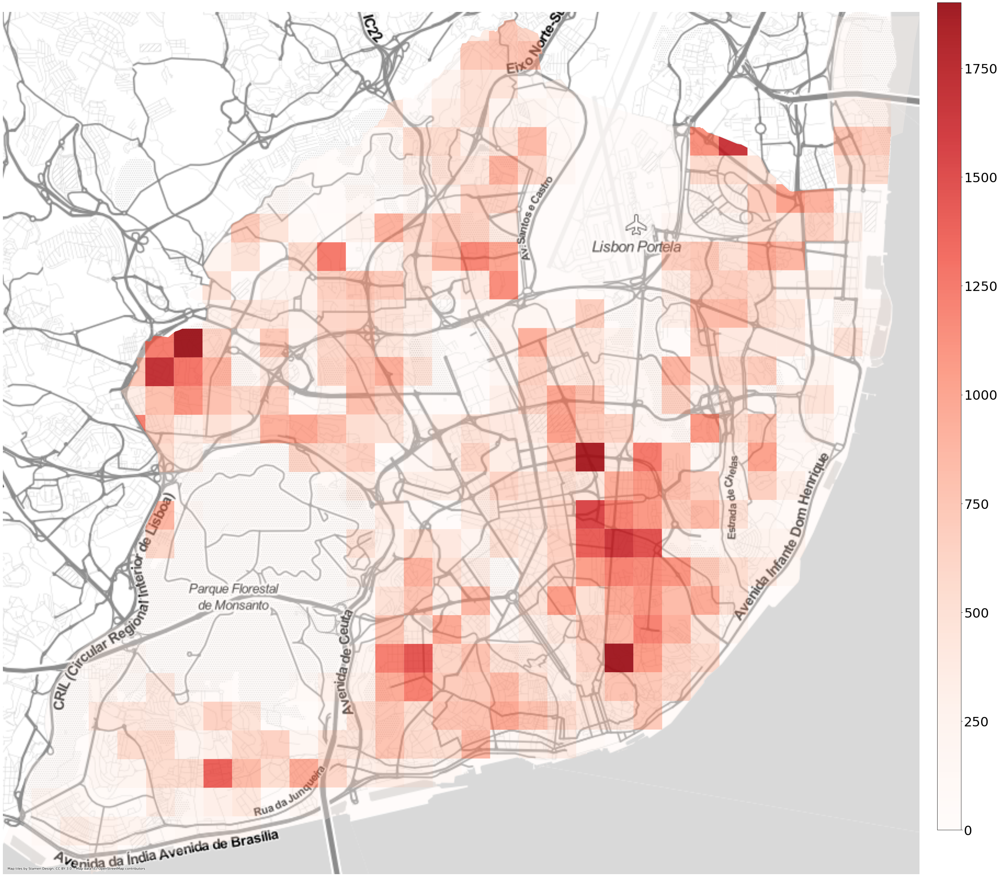

time: 4.06 s (started: 2021-08-15 10:47:42 +02:00)


In [23]:
# plot the population density data on a map background
plt.rcParams.update({'font.size':32})
import contextily as ctx
# ctx uses epsg:3857
polyframe_3857 = polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

#ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
fig, ax = plt.subplots(figsize=(40,40))
polyframe_3857.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_3857.population), vmax=max(polyframe_3857.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

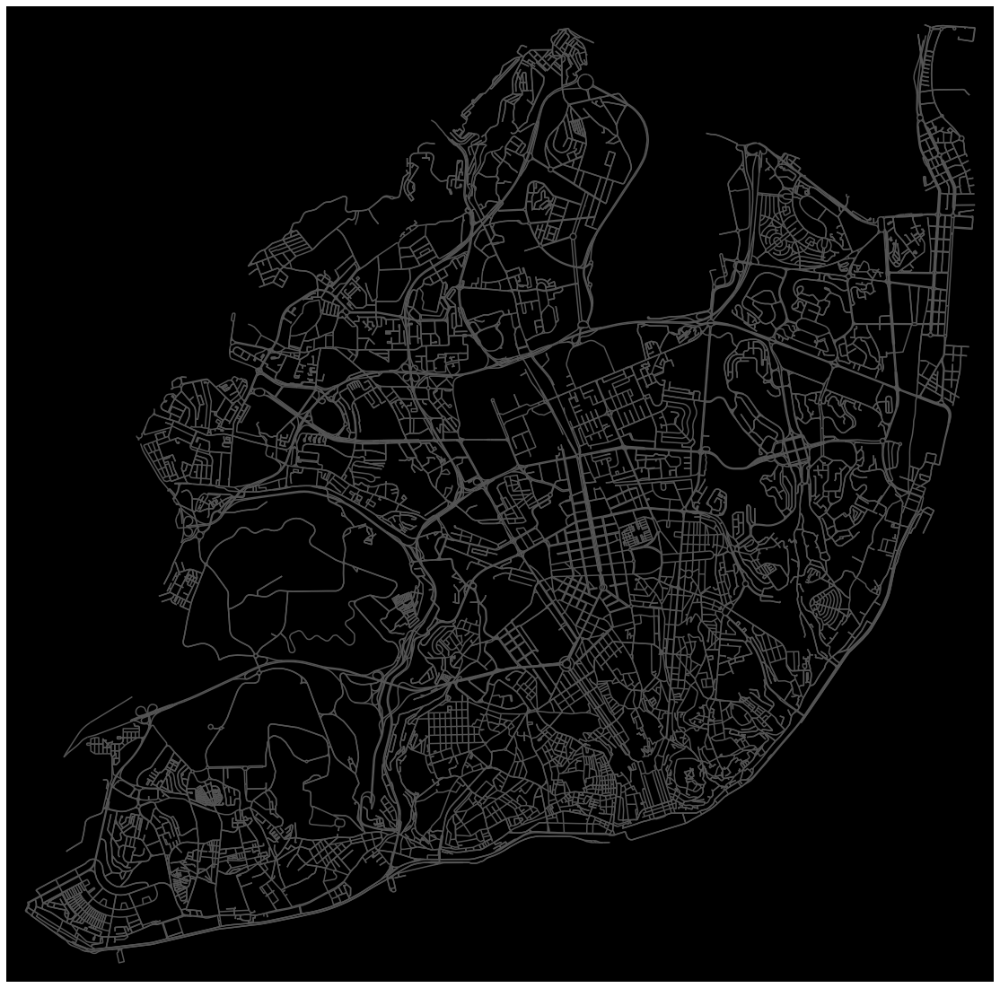

time: 16.2 s (started: 2021-08-15 10:47:46 +02:00)


In [24]:
# download and project a street network
G = ox.graph_from_place(city_name, network_type="drive")
#G = ox.project_graph(G)
fig, ax = ox.plot_graph(G, figsize=(20,20), bgcolor='k', node_size=0, node_color='#999999', node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=1.5, edge_alpha=1)

In [25]:
# set new coordinate reference system
from pyproj import CRS
crs = CRS.from_epsg(4326)
polyframe_gps = polyframe.to_crs(crs)
print(polyframe_gps.crs)

epsg:4326
time: 248 ms (started: 2021-08-15 10:48:02 +02:00)


<ipython-input-26-0e3ed00070c8>:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


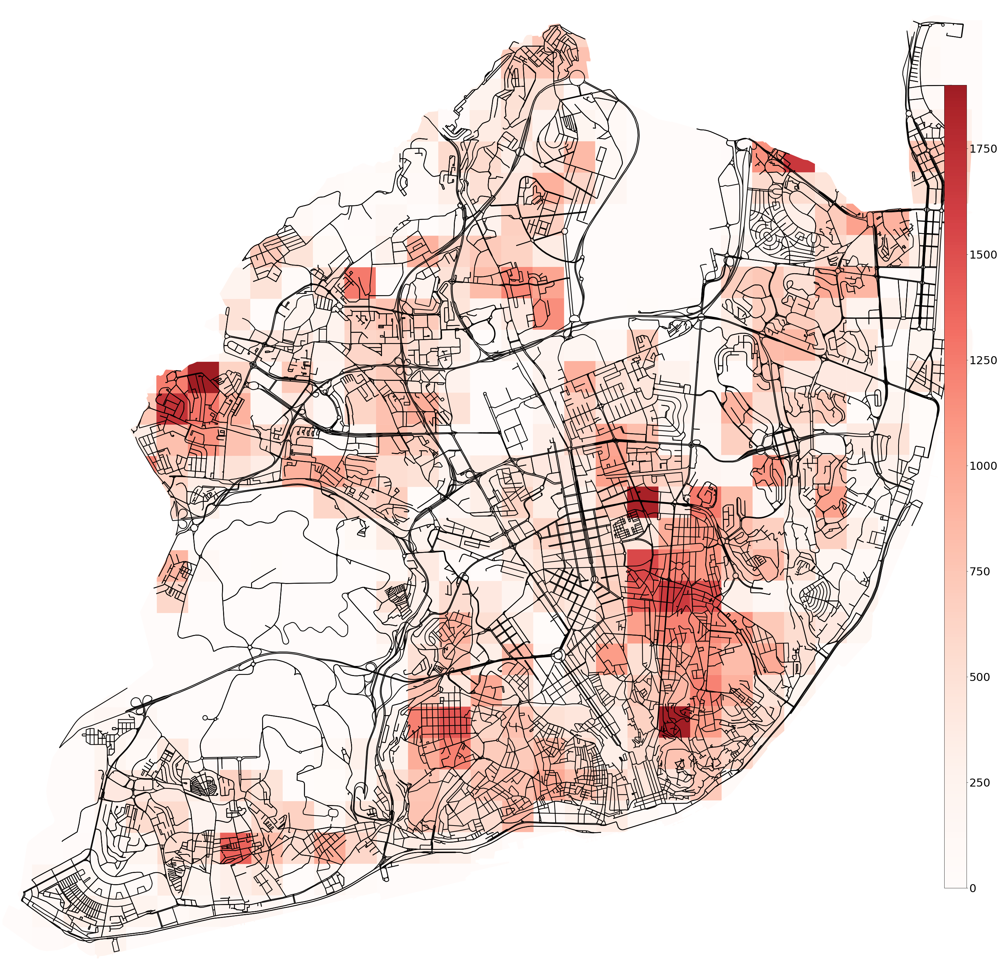

time: 4.07 s (started: 2021-08-15 10:48:03 +02:00)


In [26]:
fig, ax = plt.subplots(figsize=(40,40))

#plt.close()
polyframe_gps.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

ox.plot_graph(G, ax=ax, figsize=(40,40),show=False, close=False, \
              node_color='grey', node_size=0, edge_linewidth=2.25, node_alpha=0.8, node_zorder=10,
              edge_color='black')

cbax = fig.add_axes([0.95, 0.1, 0.0225, 0.8])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_gps.population), vmax=max(polyframe_gps.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ax.axis('off')
plt.tight_layout()
#plt.savefig('../data/Milan_pop_density_with_streets.jpg', dpi=150)
plt.show()

In [27]:
# let's get a list containing the street network node IDs
graph = G.nodes(data=True)
nodelist = [x[0] for x in graph]
nodelist[:10]

[21270959,
 21270962,
 21270969,
 21272087,
 21272088,
 21424776,
 21424795,
 21424798,
 21424809,
 21433133]

time: 4.47 ms (started: 2021-08-15 10:48:07 +02:00)


In [28]:
# then, we create a dataframe containing features of the street nodes (junctions)
from tqdm import tqdm
street_dict = {'osmid':[], 'lon':[], 'lat':[], 'street_count':[]}
for node in tqdm(nodelist):
    street_dict['osmid'].append(node)
    street_dict['lon'].append(graph[node]['x'])
    street_dict['lat'].append(graph[node]['y'])
    street_dict['street_count'].append(graph[node]['street_count'])
    
street_frame = pd.DataFrame(street_dict)
street_frame.head(10)

100%|██████████| 9811/9811 [00:00<00:00, 417024.57it/s]


,osmid,lon,lat,street_count
0,21270959,-9.165944,38.757318,3
1,21270962,-9.161733,38.758035,3
2,21270969,-9.136542,38.763211,3
3,21272087,-9.188383,38.747959,3
4,21272088,-9.188400,38.747807,3
5,21424776,-9.188087,38.748798,3
6,21424795,-9.189558,38.747253,3
7,21424798,-9.185338,38.746832,3
8,21424809,-9.185371,38.746555,3
9,21433133,-9.176166,38.718981,3


time: 62.6 ms (started: 2021-08-15 10:48:07 +02:00)


In [29]:
# let's create Point geometries from the lat, lon pairs. 
geometry = [Point(xy) for xy in zip(street_frame.lon, street_frame.lat)]
street_frame = street_frame.drop(['lon', 'lat'], axis=1)
gdf = gpd.GeoDataFrame(street_frame, crs=crs, geometry=geometry)
gdf.tail()

,osmid,street_count,geometry
9806,8917163864,3,POINT (-9.17190 38.74810)
9807,8922995202,3,POINT (-9.17792 38.76240)
9808,8922995203,1,POINT (-9.17820 38.76218)
9809,8929307039,3,POINT (-9.16941 38.70677)
9810,8929307040,3,POINT (-9.16956 38.70688)


time: 426 ms (started: 2021-08-15 10:48:07 +02:00)


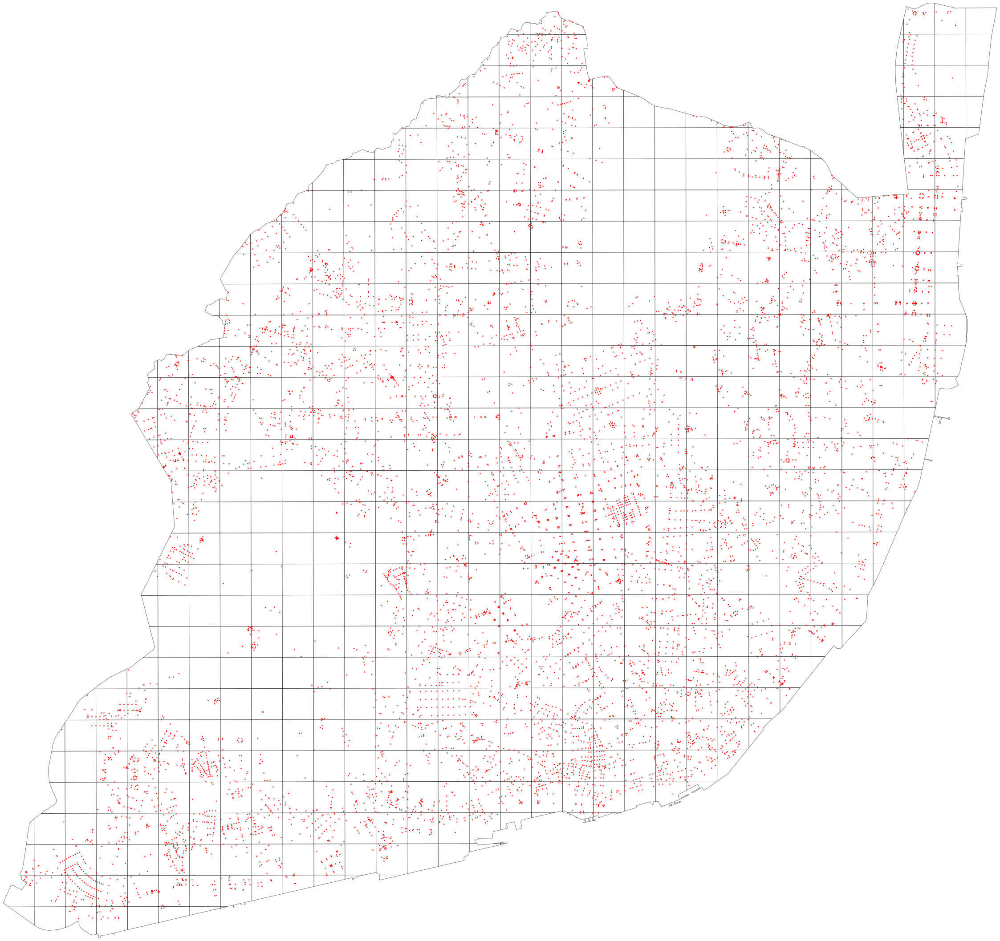

time: 1.64 s (started: 2021-08-15 10:48:07 +02:00)


In [30]:
west, south, east, north = polyframe_gps.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(polyframe_gps.geometry, np.arange(len(polyframe_gps))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5)
    ax.add_patch(patch)
#     plt.annotate(s=n, xy=p,
#                  horizontalalignment='center', size=7)
gdf.plot(ax=ax, color='red', markersize=2, zorder=2)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [31]:
pointInPoly = gpd.sjoin(polyframe_gps, gdf, op='contains')
print(len(pointInPoly))
pointInPoly.head(10)

9809


,geometry,population,index_right,osmid,street_count
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,8202,3773425563,5
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,8195,3750825825,3
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,713,207570371,3
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,8198,3750826173,3
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,5356,1139428122,3
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,8191,3750825628,4
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,8462,4004601297,3
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,8194,3750825824,3
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,8463,4004601315,4
1,"POLYGON ((-9.22733 38.69839, -9.22735 38.69840...",0.0,2462,310164305,3


time: 476 ms (started: 2021-08-15 10:48:09 +02:00)


In [32]:
streetcounts = pointInPoly.groupby(pointInPoly.index)['index_right'].count()
counts = pd.DataFrame(streetcounts)
counts.columns = ['counts']
counts

,counts
0,9
1,8
4,1
7,1
8,17
...,...
636,6
637,1
645,1
646,20


time: 7 ms (started: 2021-08-15 10:48:09 +02:00)


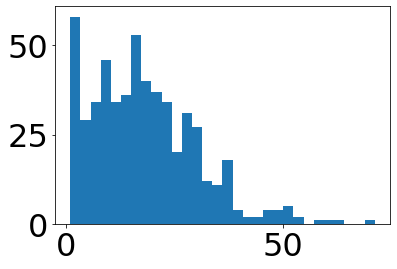

time: 113 ms (started: 2021-08-15 10:48:09 +02:00)


In [33]:
# a quick histogram of the street node counts
plt.hist(counts.counts, bins=30)
plt.show()

In [34]:
polycounts = polyframe_gps.copy()
polycounts['counts'] = counts.counts
polycounts['counts'].fillna(0, inplace=True)
polycounts['counts'] = polycounts['counts'].astype(int)
polycounts

,geometry,population,counts
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.000000,9
1,"POLYGON ((-9.22733 38.69839, -9.22735 38.69840...",0.000000,8
2,"POLYGON ((-9.22651 38.70190, -9.22607 38.70419...",0.000000,0
3,"POLYGON ((-9.22535 38.69489, -9.22534 38.69283...",0.000000,0
4,"POLYGON ((-9.22538 38.70480, -9.22436 38.70541...",15.182143,1
...,...,...,...
644,"POLYGON ((-9.19970 38.76156, -9.20070 38.76197...",0.000000,0
645,"POLYGON ((-9.20754 38.74541, -9.20915 38.74752...",1206.341431,1
646,"POLYGON ((-9.20915 38.74752, -9.21142 38.75048...",349.851318,20
647,"POLYGON ((-9.21033 38.75102, -9.21027 38.75105...",737.269104,6


time: 121 ms (started: 2021-08-15 10:48:10 +02:00)


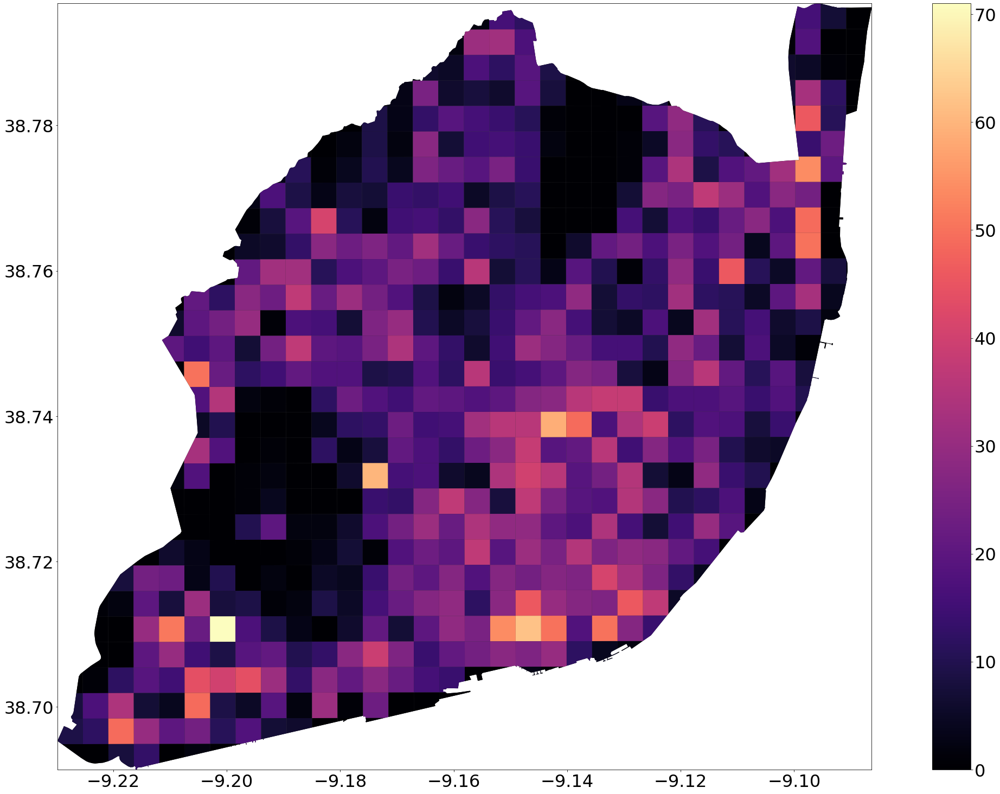

time: 728 ms (started: 2021-08-15 10:48:10 +02:00)


In [35]:
# plot the city street network density
west, south, east, north = polycounts.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polycounts.plot(column='counts',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

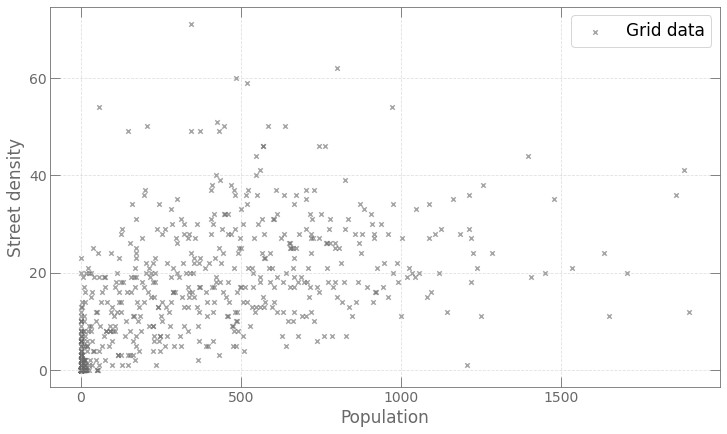

time: 136 ms (started: 2021-08-15 10:48:10 +02:00)


In [36]:
fig, ax = plt.subplots(figsize=(12, 7))
ax.scatter(polycounts.population, polycounts.counts, alpha=0.6, color='dimgrey',\
           zorder=1, marker='x', label = "Grid data", s=20)

ax.legend(prop={'size': 17})
plt.xlabel('Population', size=17, color='dimgrey')
plt.ylabel('Street density', size=17, color='dimgrey', rotation=90)

ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')
ax.tick_params(direction="in", size=10)
ax.spines['bottom'].set_color('dimgrey')
ax.spines['top'].set_color('dimgrey') 
ax.spines['right'].set_color('dimgrey')
ax.spines['left'].set_color('dimgrey')
ax.tick_params(axis='x', colors='dimgrey')
ax.tick_params(axis='y', colors='dimgrey')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
ax.grid(alpha=0.4,ls='--')
# plt.savefig('pop_dens_milan.jpg', dpi=120)
plt.show()

In [37]:
np.corrcoef(polycounts.population,polycounts.counts)

array([[1.        , 0.55197334],
       [0.55197334, 1.        ]])

time: 2.27 ms (started: 2021-08-15 10:48:11 +02:00)


In [38]:
import pandana

time: 5.42 ms (started: 2021-08-15 10:48:11 +02:00)


In [39]:
from pandana.loaders import osm

import warnings
warnings.filterwarnings('ignore')

time: 1.45 ms (started: 2021-08-15 10:48:11 +02:00)


In [40]:
# get bounding box of city first
west, south, east, north = polycounts.unary_union.bounds
print(west, south, east, north)

-9.229835599999998 38.69139939999999 -9.0863328 38.79675839999999
time: 99.7 ms (started: 2021-08-15 10:48:11 +02:00)


In [41]:
network = osm.pdna_network_from_bbox(south, west, north, east)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](38.69139940,-9.22983560,38.79675840,-9.08633280);>;);out;'}"
Downloaded 25,023.3KB from www.overpass-api.de in 1.84 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.40 seconds
Returning OSM data with 148,395 nodes and 36,204 ways...
Edge node pairs completed. Took 29.98 seconds
Returning processed graph with 44,304 nodes and 64,259 edges...
Completed OSM data download and Pandana node and edge table creation in 35.02 seconds
time: 37.5 s (started: 2021-08-15 10:48:11 +02:00)


In [42]:
network.nodes_df.head()

,x,y
id,,
21270959,-9.165944,38.757318
21270962,-9.161733,38.758035
21270964,-9.153463,38.760161
21270969,-9.136542,38.763211
21270970,-9.132728,38.763148


time: 6.03 ms (started: 2021-08-15 10:48:48 +02:00)


In [43]:
network.edges_df.head()

,,from,to,distance
21270959,413210796,21270959,413210796,44.844854
21270962,6433545925,21270962,6433545925,99.723423
21270964,1302807246,21270964,1302807246,363.813580
21270969,2265747740,21270969,2265747740,269.065394
21270970,21270969,21270970,21270969,330.888487


time: 8.15 ms (started: 2021-08-15 10:48:48 +02:00)


In [44]:
restaurants = osm.node_query(
    south, west, north, east, tags='"amenity"="restaurant"')

time: 848 ms (started: 2021-08-15 10:48:48 +02:00)


In [45]:
restaurants.head()

,lat,lon,amenity,name,wheelchair,addr:city,addr:street,cuisine,addr:housenumber,addr:postcode,...,diet:gluten_free,fax,payment:maestro,name:zh,toilets:access,name:ja,opening_hours:covid19,diet:meat,diet:omnivore,diet:pescetarian
id,,,,,,,,,,,,,,,,,,,,,
289048230,38.731864,-9.152281,restaurant,Saraiva,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
371083164,38.724344,-9.150056,restaurant,The Great American Disaster,yes,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
376811896,38.716613,-9.141757,restaurant,Hard Rock Cafe Lisboa,yes,Lisboa,Praça dos Restauradores,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
402593471,38.730575,-9.147032,restaurant,Pizza Hut,NaN,NaN,NaN,pizza,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
402605346,38.718170,-9.145569,restaurant,Gioia Food Lab,NaN,NaN,NaN,regional,50,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


time: 17.5 ms (started: 2021-08-15 10:48:49 +02:00)


In [46]:
restaurant_nodes = network.get_node_ids(restaurants.lon, restaurants.lat)
network.set(restaurant_nodes, 
            name = 'restaurants')

time: 14.3 ms (started: 2021-08-15 10:48:49 +02:00)


In [47]:
accessibility = network.aggregate(distance = 500,
                                  type = 'count',
                                  name = 'restaurants')
accessibility.describe()

count    44304.000000
mean         9.964315
std         23.342627
min          0.000000
25%          0.000000
50%          2.000000
75%          8.000000
max        221.000000
dtype: float64

time: 215 ms (started: 2021-08-15 10:48:49 +02:00)


In [48]:
accessibility.head()

id
21270959    3.0
21270962    0.0
21270964    1.0
21270969    0.0
21270970    0.0
dtype: float64

time: 3.68 ms (started: 2021-08-15 10:48:49 +02:00)


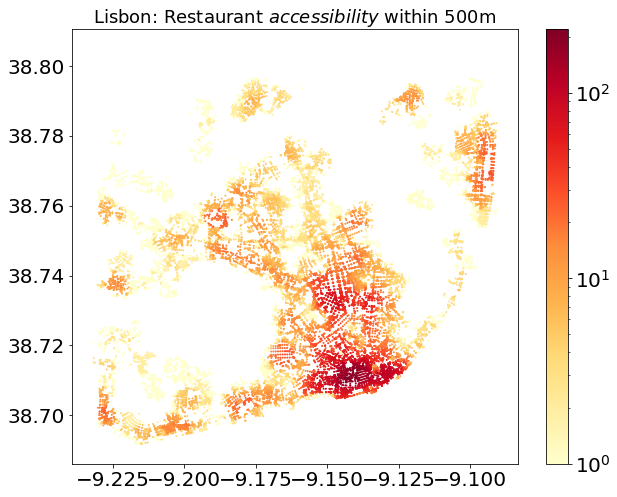

time: 800 ms (started: 2021-08-15 10:48:49 +02:00)


In [49]:

import matplotlib
plt.rcParams.update({'font.size':20})
fig, ax = plt.subplots(figsize=(10,8))

plt.title('Lisbon: Restaurant $accessibility$ within 500m', size = 18)
plt.scatter(network.nodes_df.x, network.nodes_df.y, 
            c=accessibility, s=1, cmap='YlOrRd', 
            norm=matplotlib.colors.LogNorm())
cb = plt.colorbar()

plt.show()

In [50]:
network_nodes = network.nodes_df
network_nodes.head()

,x,y
id,,
21270959,-9.165944,38.757318
21270962,-9.161733,38.758035
21270964,-9.153463,38.760161
21270969,-9.136542,38.763211
21270970,-9.132728,38.763148


time: 6.09 ms (started: 2021-08-15 10:48:50 +02:00)


In [51]:
network_nodes['accessibility'] = accessibility
network_nodes.head()

,x,y,accessibility
id,,,
21270959,-9.165944,38.757318,3.0
21270962,-9.161733,38.758035,0.0
21270964,-9.153463,38.760161,1.0
21270969,-9.136542,38.763211,0.0
21270970,-9.132728,38.763148,0.0


time: 7.14 ms (started: 2021-08-15 10:48:50 +02:00)


In [52]:
geometry = [Point(xy) for xy in zip(network_nodes.x, network_nodes.y)]
network_nodes = network_nodes.drop(['x', 'y'], axis=1)
network_gdf = gpd.GeoDataFrame(network_nodes, crs=crs, geometry=geometry)
network_gdf.head()

,accessibility,geometry
id,,
21270959,3.0,POINT (-9.16594 38.75732)
21270962,0.0,POINT (-9.16173 38.75804)
21270964,1.0,POINT (-9.15346 38.76016)
21270969,0.0,POINT (-9.13654 38.76321)
21270970,0.0,POINT (-9.13273 38.76315)


time: 974 ms (started: 2021-08-15 10:48:50 +02:00)


In [53]:
len(network_gdf)

44304

time: 1.88 ms (started: 2021-08-15 10:48:51 +02:00)


In [54]:
pointInPoly = gpd.sjoin(polyframe_gps, network_gdf, op='contains')

time: 1.22 s (started: 2021-08-15 10:48:51 +02:00)


In [55]:

print(len(pointInPoly))
pointInPoly.head(10)

34853


,geometry,population,index_right,accessibility
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,1139428122,10.0
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,3750825628,12.0
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,4004601297,12.0
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,4231639595,12.0
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,3750825824,12.0
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,4231639593,12.0
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,4004601315,12.0
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,3773425563,14.0
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,4231639592,8.0
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.0,3750825825,14.0


time: 22.8 ms (started: 2021-08-15 10:48:52 +02:00)


In [67]:
aggr_access = pointInPoly.groupby(pointInPoly.index)['accessibility'].mean()
aggr_access_df = pd.DataFrame(aggr_access)
aggr_access_df.columns = ['aggr_access']
aggr_access_df

,aggr_access
0,6.628571
1,17.347826
3,0.000000
4,0.250000
5,0.000000
...,...
644,0.000000
645,0.500000
646,4.020408
647,1.387097


time: 9.54 ms (started: 2021-08-15 10:49:17 +02:00)


In [68]:
aggr_access_df.value_counts()

aggr_access
0.000000       178
1.000000         9
2.000000         5
0.625000         3
0.043478         2
              ... 
1.975000         1
1.938272         1
1.925926         1
1.918367         1
180.784946       1
Length: 407, dtype: int64

time: 6.49 ms (started: 2021-08-15 10:49:20 +02:00)


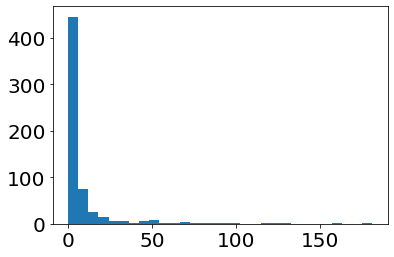

time: 126 ms (started: 2021-08-15 10:49:22 +02:00)


In [69]:
# a quick histogram of the aggregated accessibility
plt.hist(aggr_access_df.aggr_access, bins=30)
plt.show()

In [70]:
polyaccess = polyframe_gps.copy()
polyaccess['aggr_access'] = aggr_access_df.aggr_access
polyaccess['aggr_access'].fillna(0, inplace=True)
#polyaccess['aggr_access'] = polyaccess['aggr_access'].astype(int)
polyaccess

,geometry,population,aggr_access
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.000000,6.628571
1,"POLYGON ((-9.22733 38.69839, -9.22735 38.69840...",0.000000,17.347826
2,"POLYGON ((-9.22651 38.70190, -9.22607 38.70419...",0.000000,0.000000
3,"POLYGON ((-9.22535 38.69489, -9.22534 38.69283...",0.000000,0.000000
4,"POLYGON ((-9.22538 38.70480, -9.22436 38.70541...",15.182143,0.250000
...,...,...,...
644,"POLYGON ((-9.19970 38.76156, -9.20070 38.76197...",0.000000,0.000000
645,"POLYGON ((-9.20754 38.74541, -9.20915 38.74752...",1206.341431,0.500000
646,"POLYGON ((-9.20915 38.74752, -9.21142 38.75048...",349.851318,4.020408
647,"POLYGON ((-9.21033 38.75102, -9.21027 38.75105...",737.269104,1.387097


time: 120 ms (started: 2021-08-15 10:49:25 +02:00)


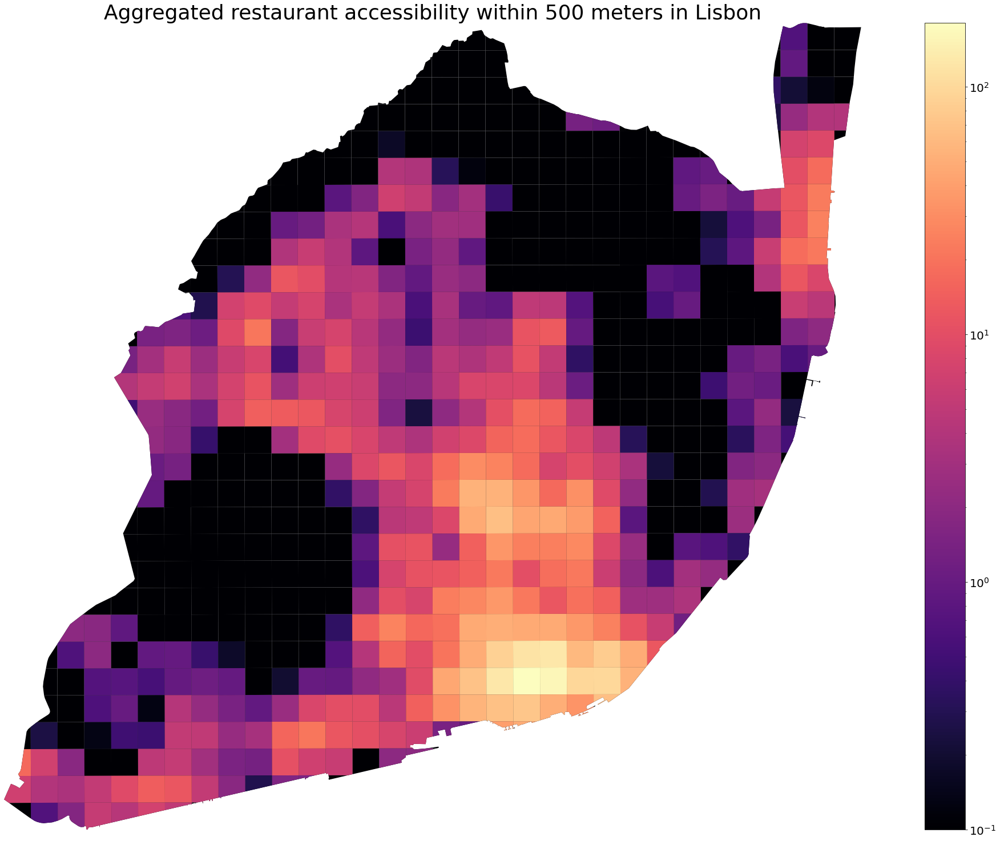

time: 1.06 s (started: 2021-08-15 10:49:28 +02:00)


In [71]:
# plot the city aggregated accessibility

LOGMIN = 0.1  # arbitrary lower bound, as appropriate for log-scaled data display
west, south, east, north = polyaccess.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polyaccess.plot(column='aggr_access',  legend=True, \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.aggr_access.min(), LOGMIN), \
                                   vmax=polyaccess.aggr_access.max()), \
                                    cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.title("Aggregated restaurant accessibility within 500 meters in Lisbon", size = 36)
ax.axis('off')
plt.show()

In [72]:
polyaccess["pop_int"] = polyaccess.population.astype(int) + 1
polyaccess.head()

,geometry,population,aggr_access,pop_int
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.000000,6.628571,1
1,"POLYGON ((-9.22733 38.69839, -9.22735 38.69840...",0.000000,17.347826,1
2,"POLYGON ((-9.22651 38.70190, -9.22607 38.70419...",0.000000,0.000000,1
3,"POLYGON ((-9.22535 38.69489, -9.22534 38.69283...",0.000000,0.000000,1
4,"POLYGON ((-9.22538 38.70480, -9.22436 38.70541...",15.182143,0.250000,16


time: 27.5 ms (started: 2021-08-15 10:49:33 +02:00)


In [73]:
polyaccess["access_normalised"] = polyaccess.aggr_access / polyaccess.pop_int 
polyaccess.head()

,geometry,population,aggr_access,pop_int,access_normalised
0,"POLYGON ((-9.22984 38.69533, -9.22868 38.69737...",0.000000,6.628571,1,6.628571
1,"POLYGON ((-9.22733 38.69839, -9.22735 38.69840...",0.000000,17.347826,1,17.347826
2,"POLYGON ((-9.22651 38.70190, -9.22607 38.70419...",0.000000,0.000000,1,0.000000
3,"POLYGON ((-9.22535 38.69489, -9.22534 38.69283...",0.000000,0.000000,1,0.000000
4,"POLYGON ((-9.22538 38.70480, -9.22436 38.70541...",15.182143,0.250000,16,0.015625


time: 27.8 ms (started: 2021-08-15 10:49:35 +02:00)


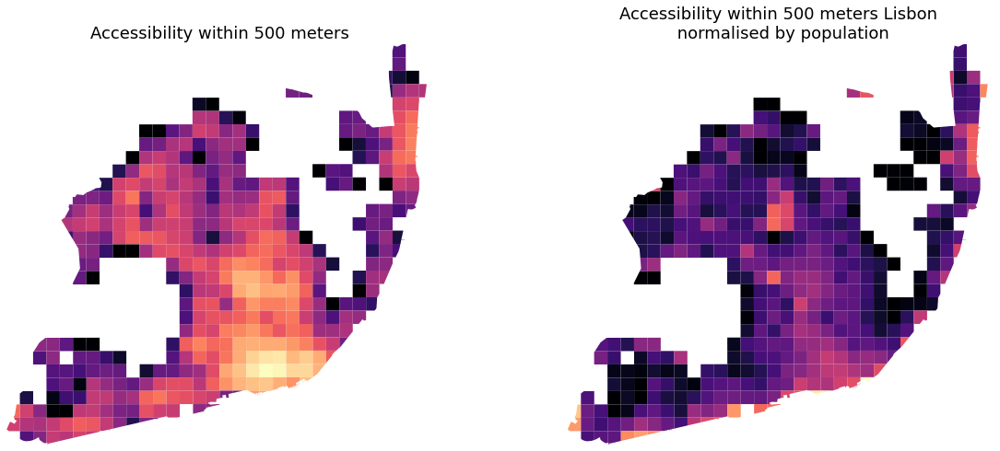

time: 513 ms (started: 2021-08-15 10:49:43 +02:00)


In [75]:
f, ax = plt.subplots(1,2,figsize=(20,8))

polyaccess.plot(column='aggr_access', ax = ax[0], \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.aggr_access.min(), LOGMIN), \
                                   vmax=polyaccess.aggr_access.max()), \
                                    cmap='magma')   
  
ax[0].axis(polyaccess.total_bounds[np.asarray([0,2,1,3])])
ax[0].set_title("Accessibility within 500 meters", size = 18)


polyaccess.plot(column='access_normalised', ax = ax[1], \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.access_normalised.min(), 0.001), \
                                   vmax=polyaccess.access_normalised.max()), \
                                    cmap='magma')

ax[1].axis(polyaccess.total_bounds[np.asarray([0,2,1,3])])
ax[1].set_title("Accessibility within 500 meters Lisbon \n normalised by population", size = 18)
ax[0].axis('off')
ax[1].axis('off')
plt.show()

In [76]:
sum(polyaccess.access_normalised)

247.52537967646535

time: 2.26 ms (started: 2021-08-15 10:49:48 +02:00)


In [77]:
#print final score
polyaccess.access_normalised.mean()

0.3813950380222887

time: 2.28 ms (started: 2021-08-15 10:49:50 +02:00)


In [78]:
polyaccess.aggr_access.mean()

7.253335657073587

time: 2.31 ms (started: 2021-08-15 10:49:52 +02:00)


In [79]:
polyaccess.access_normalised.sum()

247.52537967646532

time: 2.49 ms (started: 2021-08-15 10:50:15 +02:00)


In [80]:
sum(polyaccess.access_normalised)

247.52537967646535

time: 73.6 ms (started: 2021-08-16 16:03:33 +02:00)
